# Mask R-CNN - Predict
Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [2]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage


# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log


#from samples.guns_and_swords import gns
from samples.cattle_demo import cattle

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
GNS_WEIGHTS_PATH = "C:/users/ateeb/desktop/Mask_RCNN/logs/cattledemo20200530T0510/mask_rcnn_cattle_0012.h5"  # TODO: update this path

## Configurations

In [3]:
config = cattle.CattleConfig()
GNS_DIR = "C://users//ateeb//desktop//procdata"

In [4]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [6]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [7]:
# Load validation dataset
dataset = cattle.CattleDataset()
dataset.load_Cattle(GNS_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 373
Classes: ['BG', 'cattle']


## Load Model

In [8]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)
    

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


In [9]:
# Set path to balloon weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases
# weights_path = "/path/to/mask_rcnn_balloon.h5"

# Or, load the last model you trained
# weights_path = model.find_last()
weights_path = GNS_WEIGHTS_PATH
# Load weights
model.load_weights(weights_path, by_name=True)

Re-starting from epoch 12


## Running Detection on training dataset

image ID: Cattle.476.jpg (152) None
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:   26.00000  max:  847.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool


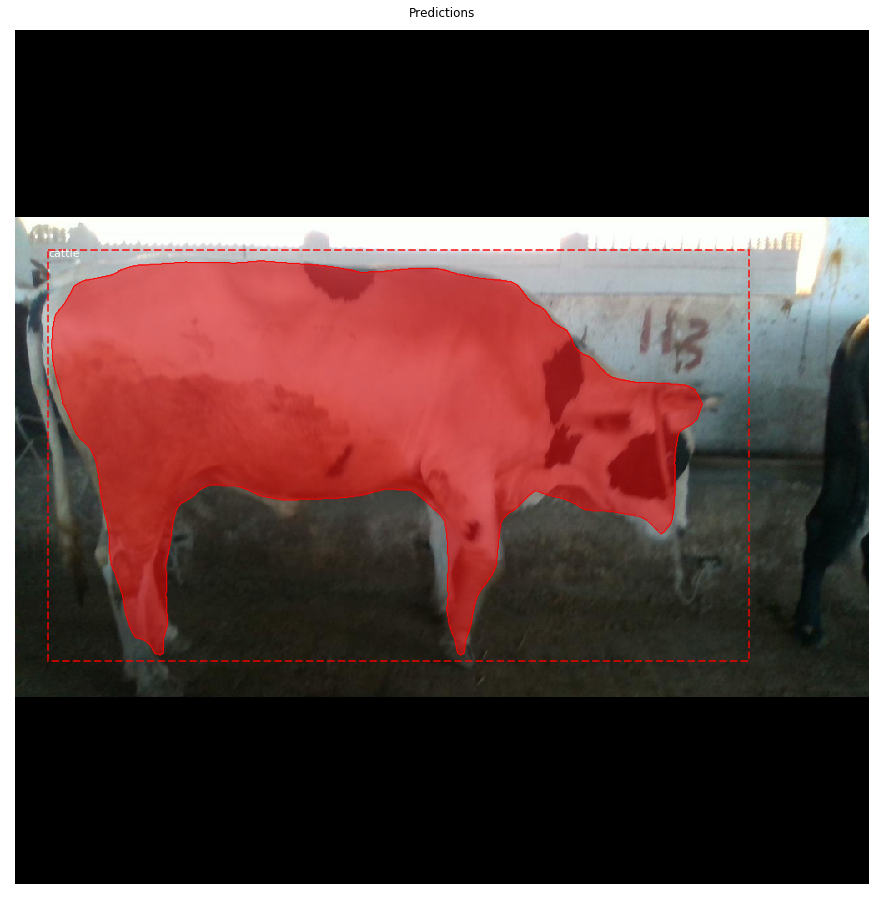

In [10]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
a = visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


# running detection on single new image

Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
1047.jpg 1.9250000914325938 370612
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
1110.jpg 2.2430001065367833 310688
Processing 1 images
image                    shape: (720, 1280, 3)        min:    2.00000  max:  255.00000  uint8
molded_image

'\n# Run object detection\nresults = model.detect([image], verbose=1)\nr = results[0]\n\n\n# Display results\nax = get_ax(1)\na = visualize.display_instances(image, r[\'rois\'], r[\'masks\'], r[\'class_ids\'], \n                            dataset.class_names, r[\'scores\'], ax=ax,\n                            title="Predictions")\n'

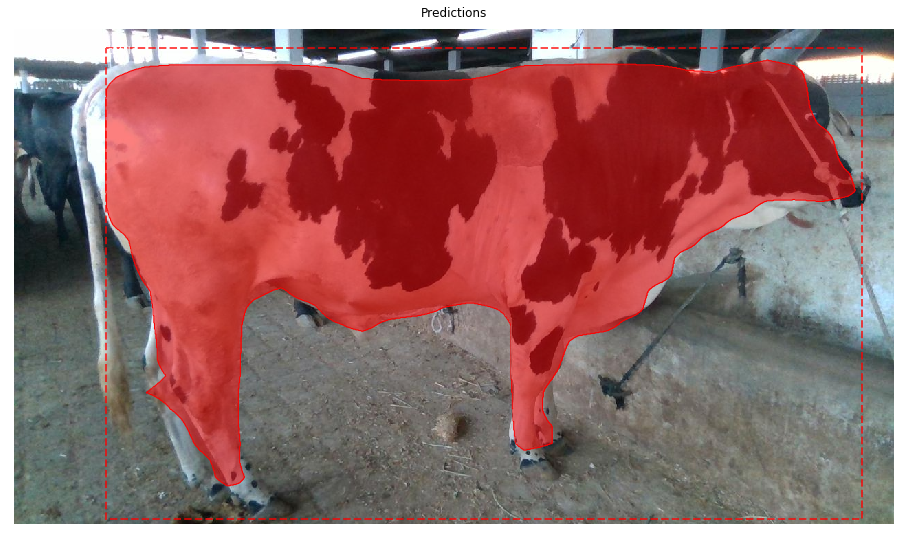

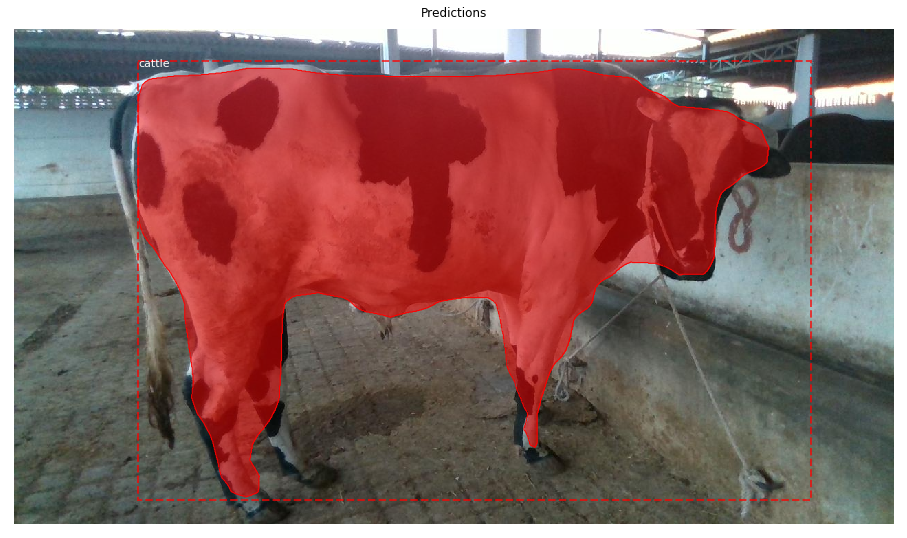

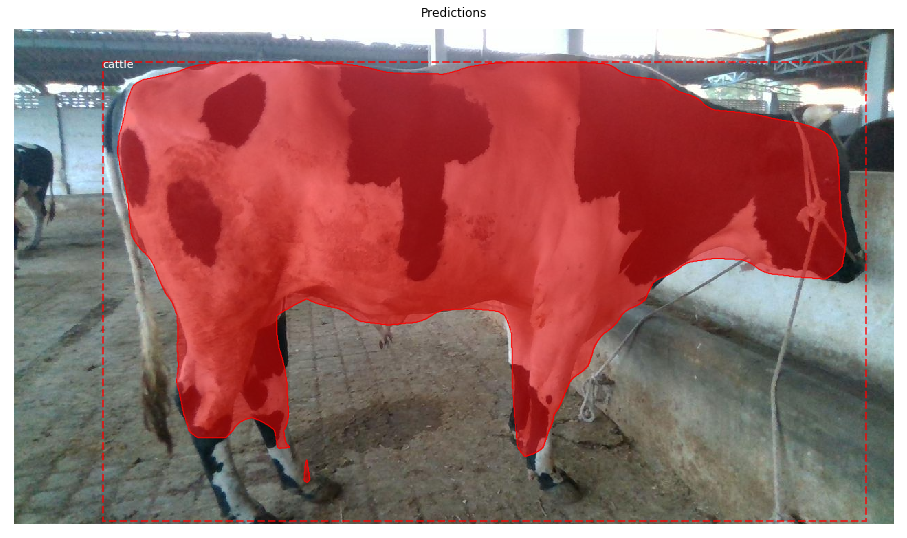

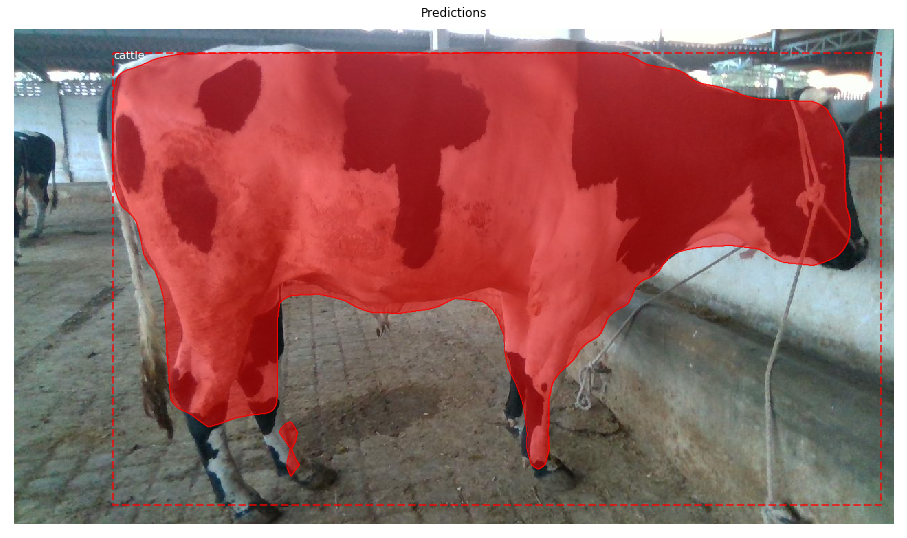

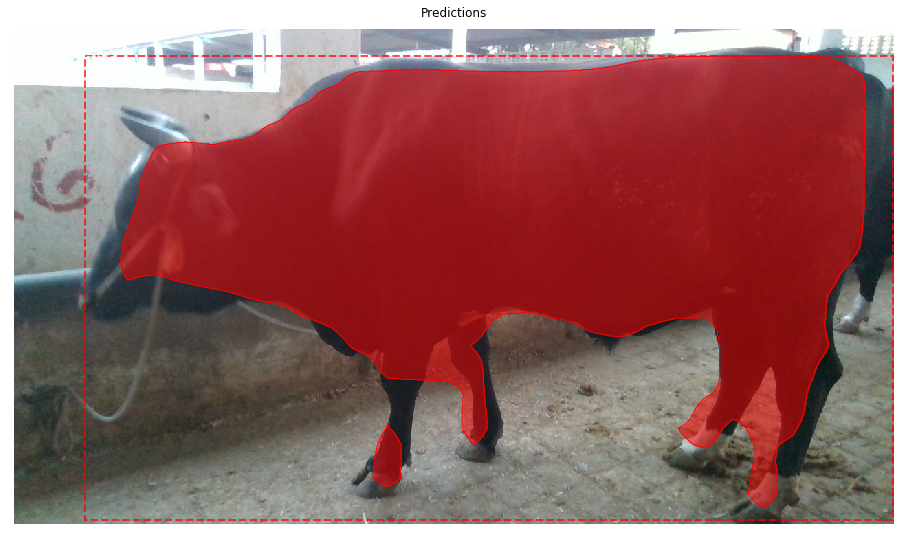

...

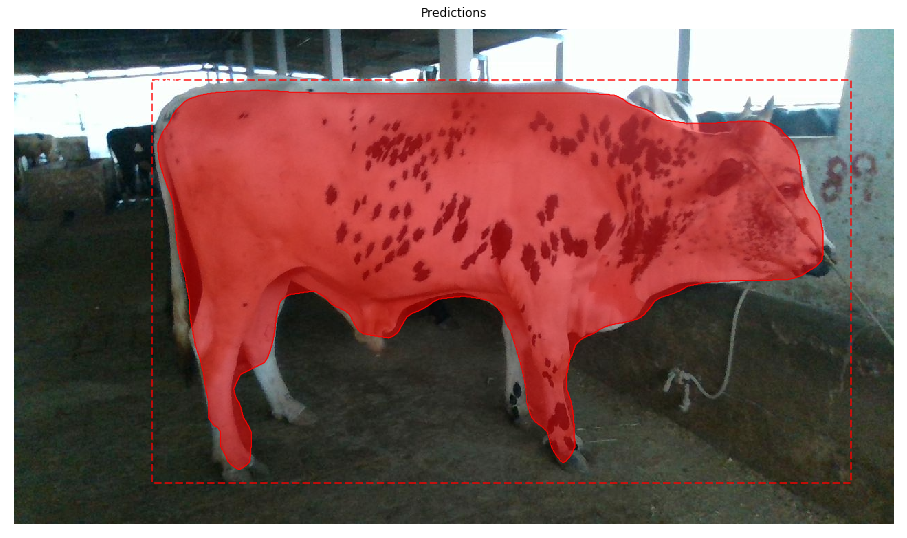

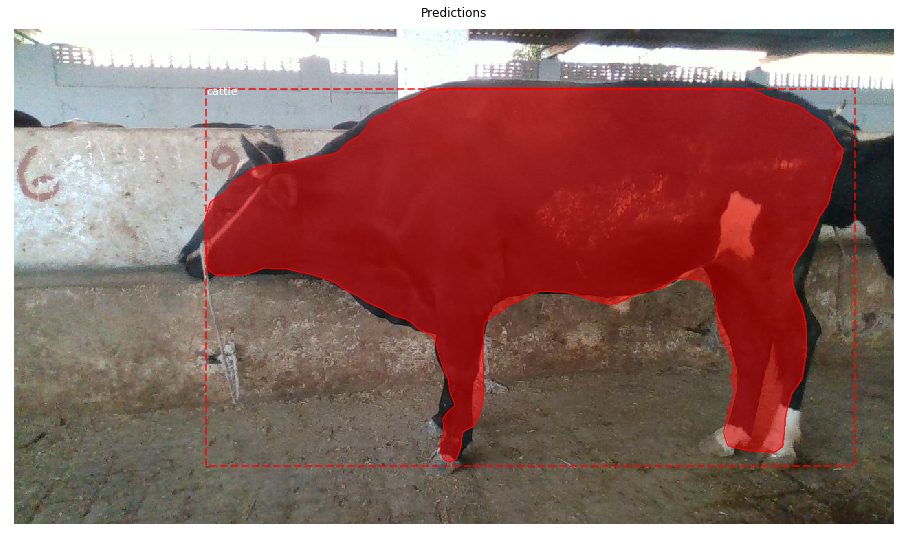

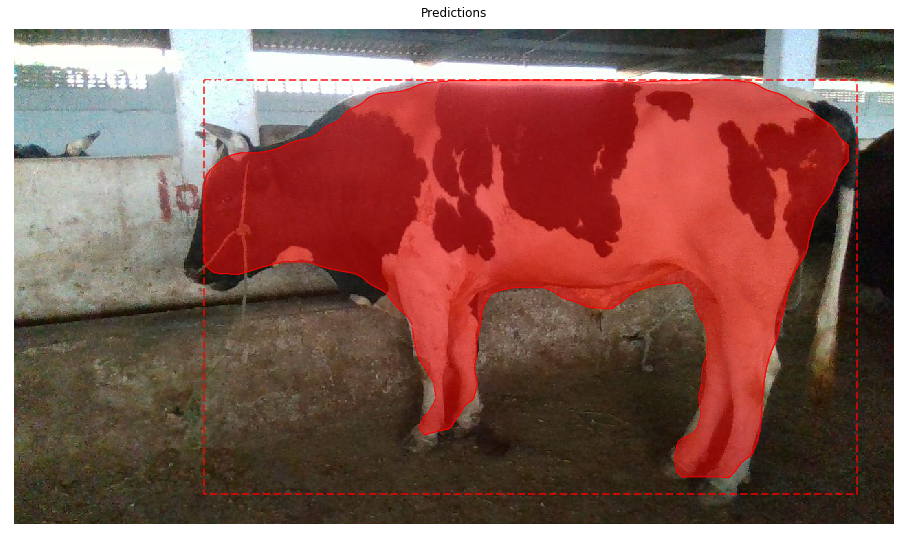

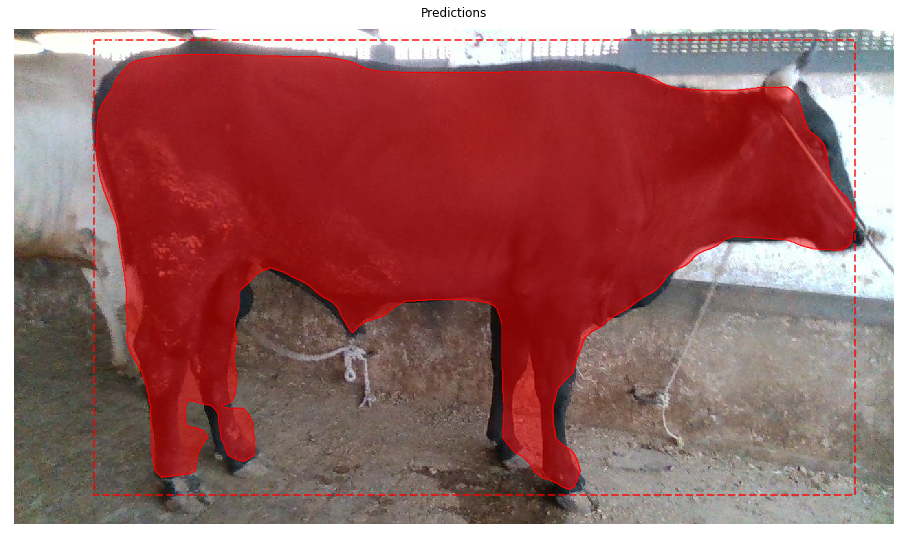

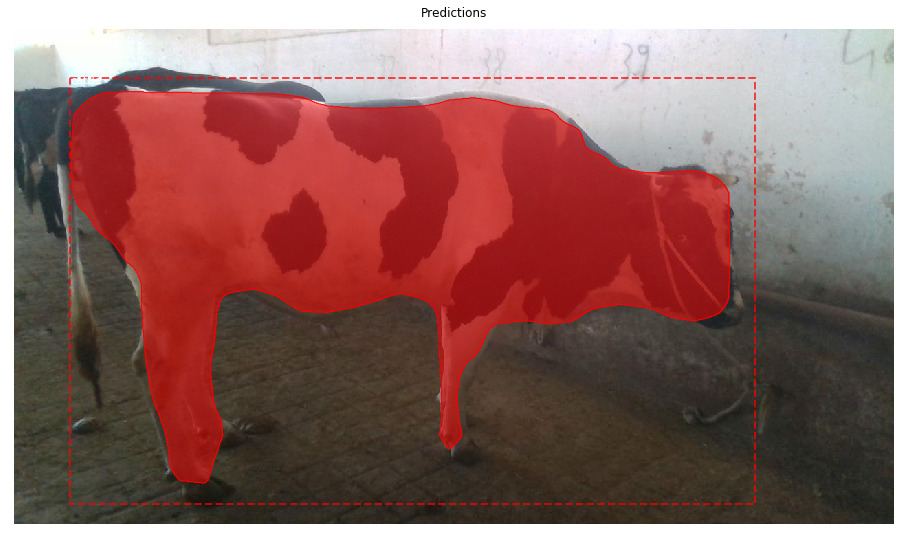

In [17]:
# Function taken from utils.dataset
from PIL import Image
import os
def load_image(image_path):
    """Load the specified image and return a [H,W,3] Numpy array.
    """
    # Load image
    image = Image.open(image_path)
#    image = image.resize((160,90))
    image = np.array(image)
    # If grayscale. Convert to RGB for consistency.
    if image.ndim != 3:
        image = skimage.color.gray2rgb(image)
    # If has an alpha channel, remove it for consistency
    if image.shape[-1] == 4:
        image = image[..., :3]
    return image

path = 'C:\\users\\ateeb\\desktop\\janwar.jpg'
image = load_image(path)

import os
path = 'C:\\users\\ateeb\\desktop\\test images\\'
d_path = 'C:\\users\\ateeb\\desktop\\test images\\depths'
factor = []
for i in os.listdir(path):
    if i[-4:] != '.jpg':
        continue
            
    image = load_image(path + '\\' + i)
    depth = np.load(d_path + '\\' + i[0:-4] + '.npy')
    
    results = model.detect([image], verbose=1)
    r = results[0]
    print(i , depth[360][640] , np.sum(r['masks'].astype('byte').flatten()))
    d = depth[360][640]
    how_big = r['masks'].astype('byte').flatten() * (depth.flatten()** 2) # factor = area the cattle would take if it was placed 1 meter away from camera
    how_fat = r['masks'].astype('byte').flatten() * (5 - depth.flatten())
    f = np.sum(how_big) * np.sum(how_fat)
    factor.append((i , f))
    ax = get_ax(1)
    a = visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
'''
# Run object detection
results = model.detect([image], verbose=1)
r = results[0]


# Display results
ax = get_ax(1)
a = visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
'''

In [18]:
print('''1047.jpg 1.9250000914325938 370612
1110.jpg 2.2430001065367833 310688
1122.jpg 2.072000098414719 376828
1126.jpg 2.0990000996971503 388842
1145.jpg 1.8440000875853002 404297
1236.jpg 1.8860000895801932 309499
1221.jpg 2.5720001221634448 206544
1258.jpg 2.422000115038827 304334
1272.jpg 2.2240001056343317 271296
1286.jpg 2.67200012691319 288119
1290.jpg 1.859000088297762 387905
1250.jpg 2.429000115371309 282616
148.jpg 2.3430001112865284 287827
''')
def a(i):
    return i[1]
factor.sort(key=a)
factor

1047.jpg 1.9250000914325938 370612
1110.jpg 2.2430001065367833 310688
1122.jpg 2.072000098414719 376828
1126.jpg 2.0990000996971503 388842
1145.jpg 1.8440000875853002 404297
1236.jpg 1.8860000895801932 309499
1221.jpg 2.5720001221634448 206544
1258.jpg 2.422000115038827 304334
1272.jpg 2.2240001056343317 271296
1286.jpg 2.67200012691319 288119
1290.jpg 1.859000088297762 387905
1250.jpg 2.429000115371309 282616
148.jpg 2.3430001112865284 287827



[('1272.jpg', 1026887057320.571),
 ('148.jpg', 1158589554233.2385),
 ('1236.jpg', 1209207704170.6333),
 ('1250.jpg', 1217897669500.8154),
 ('1258.jpg', 1385360053295.004),
 ('1110.jpg', 1457485312442.904),
 ('1286.jpg', 1576009432811.674),
 ('1047.jpg', 1624652636449.759),
 ('1145.jpg', 1717569028034.3904),
 ('1290.jpg', 1782625907389.2168),
 ('1122.jpg', 2004063199946.1868),
 ('1126.jpg', 2106779175398.3357)]

In [ ]:
def depth_function(x):
    '''function learned through experiments'''
#    return (0.9999994)*(x**1.905426)
    y = 17127750 + (0.3892065 - 17127750)/(1 + (x/5296.74)**1.998316)
    return y

df = depth_function
df(2.67)

In [ ]:

#https://www.facebook.com/watch/?v=3012968532127066
o1 = 1000 # 1 meter
o2 = 200 # 3 meter

#this should work! Period
0.4*40